
# Sonia Trabado Aguilera



### Problema 
Tanzania es un país en desarrollo que se encuentra en medio de una crisis de agua. El país lucha por proporcionar agua potable a su población de más de 57 millones de personas a pesar de que tiene muchos puntos de agua establecidos. El gobierno de Tanzania, a través del Ministerio del Agua, tiene como objetivo resolver la crisis del agua en el país manteniendo y reparando las bombas de agua a tiempo. Para que sus ingenieros logren los objetivos más rápidamente, deben saber de antemano qué bombas de agua tienen probabilidades de fallar y comprender las causas de las fallas.

Por lo tanto, el proyecto tiene como objetivo desarrollar un modelo utilizando datos recopilados por Taarifa y el Ministerio de Agua de Tanzania para predecir el estado de funcionalidad de las bombas de agua en Tanzania, así como proporcionar información importante sobre los principales factores que contribuyen a las fallas de las bombas de agua en Tanzania. El modelo creado permitirá al Ministerio del Agua de Tanzania mejorar las operaciones de mantenimiento de sus bombas de agua.

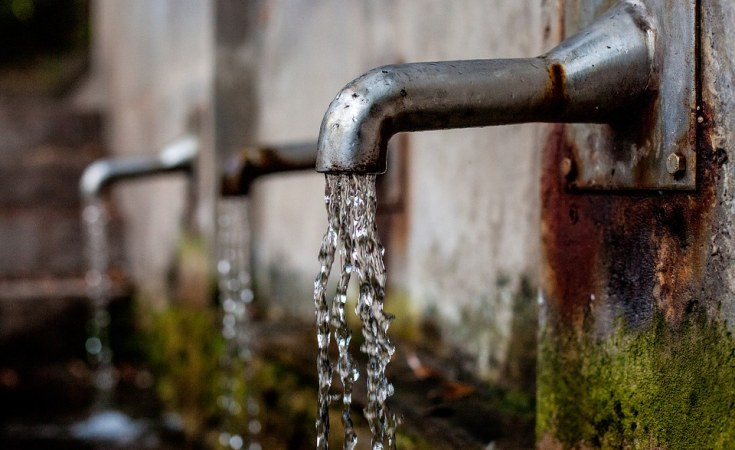

### Data

Los datos utilizados en este proyecto provienen del concurso Pump it Up: Data Mining the Water Table organizado por DrivenData, originalmente obtenido por Taarifa y el Ministerio de Agua de Tanzania.

### Este cuaderno está estructurado en estos apartados principales:

Limpieza de datos: donde se inspeccionan todas las variables y se toman los pasos necesarios para eliminar valores faltantes, corregir errores, eliminar características redundantes y aplicar las transformaciones necesarias.

Ingeniería de funciones: donde se crean algunas funciones nuevas a partir de la combinación de otras funciones existentes.

Exploración: donde se analiza la relación entre algunas variables interesantes status_group.

Modelos de referencia: donde se ajustan los siguientes modelos a los datos para obtener una puntuación de referencia: Random Forest, XGBoost,Baggin y VojtingClasifier.

Ajuste de hiperparámetros: donde los parámetros de Random Rorest y XGBoost se ajustan mediante búsquedas aleatorias iteradas. Mejor puntuación general (0,8207) obtenida mediante bosque aleatorio después del ajuste de parámetros.


### Modelos
Se evaluaron diferentes modelos y se eligió el modelo de mejor rendimiento como modelo final siendo éste VotingClassifier, que comibina predicciones de variosmodelos(en este caso de los anteriores).

### Puntuaciones platafomra DataDriven:
Experimentando con diferentes modelos utilizados, en este trabajo, sólo figuran los modelos con mejores puntuaciones.

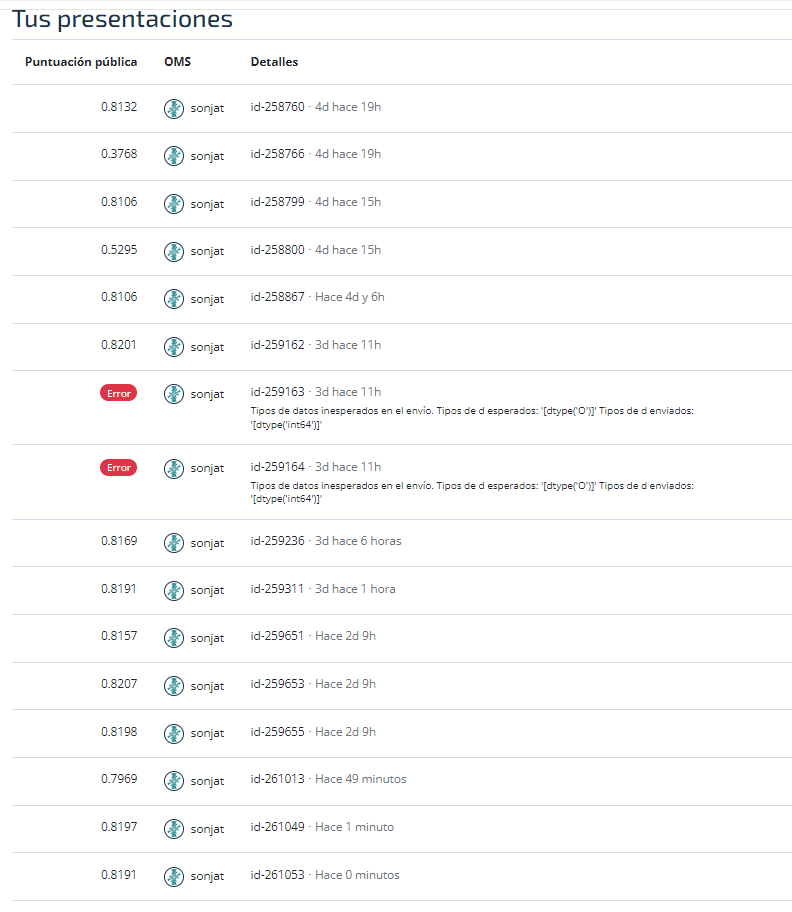

# Importación de paquetes

In [180]:
#EDA
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import scipy.stats as stats
from scipy.stats import chi2_contingency, fisher_exact

#Depuración
import missingno as msno
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
import feature_engine.imputation as fe_imp

#Codificación
import category_encoders as ce
from sklearn import preprocessing

#feature engineering
from optbinning import MulticlassOptimalBinning
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

#data modelling
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier, GradientBoostingClassifier

#evaluation
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report


#setup
import warnings
warnings.simplefilter("ignore")

pd.set_option('display.max_columns', None)


# Funciones

In [181]:
def cramers_v(var1, varObj):
    """Función que calcula v de cramer en relación a la variable objetivo"""
    
    
    if not var1.dtypes == 'object':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'object': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer

In [182]:
def winsorize_with_pandas(s, limits):
    """
    Función para colapsar los valores extremos.

    s : pd.Series
        Series to winsorize
    limits : tuple of float
        Tuple of the percentages to cut on each side of the array, 
        with respect to the number of unmasked data, as floats between 0. and 1
    """
    return s.clip(lower=s.quantile(limits[0], interpolation='lower'), #clip colapsa en un límite
                  upper=s.quantile(1-limits[1], interpolation='higher'))

In [183]:
def saca_metricas(y_true, y_pred, y_proba):

    print('matriz de confusión')
    print(confusion_matrix(y_true, y_pred))
    print('accuracy')
    print(accuracy_score(y_true, y_pred))
    print('precision')
    print(precision_score(y_true, y_pred, average='weighted')) 
    print('recall')
    print(recall_score(y_true, y_pred, average='weighted')) 
    print('f1')
    print(f1_score(y_true, y_pred, average='weighted'))
    print('ROC-AUC OvR: ')
    print(roc_auc_score(y_true, y_proba, multi_class='ovr'))
    print('ROC-AUC OvO: ')
    print(roc_auc_score(y_true, y_proba, multi_class='ovo'))

# Importación de los datos

In [184]:
train = pd.read_csv('train_set.csv')
labels = pd.read_csv('train_labels.csv')
test = pd.read_csv('test_set.csv')

In [185]:
labels

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional
...,...,...
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional


In [186]:
print(labels.shape)
print(train.shape)
print(test.shape)

(59400, 2)
(59400, 40)
(14850, 40)


In [187]:
#verificamos la coincidencia de los ids para saber si podemos concatenar sin problemas
print('Coincidencia ids train/test:\n', train['id'].isin(test['id']).value_counts())

Coincidencia ids train/test:
 id
False    59400
Name: count, dtype: int64


In [188]:
print('Comprobamos si las columnas son las mismas: \n ', test.columns.isin(train.columns))

Comprobamos si las columnas son las mismas: 
  [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


In [189]:
#columna id como índice
train.set_index('id', inplace=True)
labels.set_index('id', inplace=True)
test.set_index('id', inplace=True)

In [190]:
#guardamos los indices antes de concatenar para poder separar cuando sea necesario
indices_test = test.index.to_list()

#concatenamos los datos para el EDA a la vez que unimos la variable objetivo
df = pd.concat([train.join(labels), test])

data= df.copy(deep=True)

# Exploratory Data Analysis

In [191]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74250 entries, 69572 to 68707
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             74250 non-null  float64
 1   date_recorded          74250 non-null  object 
 2   funder                 69743 non-null  object 
 3   gps_height             74250 non-null  int64  
 4   installer              69718 non-null  object 
 5   longitude              74250 non-null  float64
 6   latitude               74250 non-null  float64
 7   wpt_name               74248 non-null  object 
 8   num_private            74250 non-null  int64  
 9   basin                  74250 non-null  object 
 10  subvillage             73780 non-null  object 
 11  region                 74250 non-null  object 
 12  region_code            74250 non-null  int64  
 13  district_code          74250 non-null  int64  
 14  lga                    74250 non-null  object 
 15  war

In [192]:
data.nunique()

amount_tsh                 102
date_recorded              369
funder                    2139
gps_height                2456
installer                 2410
longitude                71870
latitude                 71869
wpt_name                 45683
num_private                 68
basin                        9
subvillage               21425
region                      21
region_code                 27
district_code               20
lga                        125
ward                      2098
population                1128
public_meeting               2
recorded_by                  1
scheme_management           11
scheme_name               2867
permit                       2
construction_year           55
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity

In [193]:
#porcentaje de nulos declarados
data.isna().sum() / len(data) * 100

amount_tsh                0.000000
date_recorded             0.000000
funder                    6.070034
gps_height                0.000000
installer                 6.103704
longitude                 0.000000
latitude                  0.000000
wpt_name                  0.002694
num_private               0.000000
basin                     0.000000
subvillage                0.632997
region                    0.000000
region_code               0.000000
district_code             0.000000
lga                       0.000000
ward                      0.000000
population                0.000000
public_meeting            5.595960
recorded_by               0.000000
scheme_management         6.527946
scheme_name              48.554882
permit                    5.108418
construction_year         0.000000
extraction_type           0.000000
extraction_type_group     0.000000
extraction_type_class     0.000000
management                0.000000
management_group          0.000000
payment             

In [194]:
data.select_dtypes(include=np.number).describe().round(2)

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,74250.00,74250.00,74250.00,74250.00,74250.00,74250.00,74250.00,74250.00,74250.00
mean,318.69,665.67,34.07,-5.70,0.46,15.27,5.63,180.75,1298.46
std,2906.76,692.76,6.57,2.94,11.54,17.51,9.64,471.09,952.35
min,0.00,-90.00,0.00,-11.65,0.00,1.00,0.00,0.00,0.00
25%,0.00,0.00,33.09,-8.53,0.00,5.00,2.00,0.00,0.00
50%,0.00,364.00,34.91,-5.03,0.00,12.00,3.00,25.00,1986.00
75%,20.00,1317.00,37.18,-3.33,0.00,17.00,5.00,215.00,2004.00
max,350000.00,2777.00,40.35,-0.00,1776.00,99.00,80.00,30500.00,2013.00


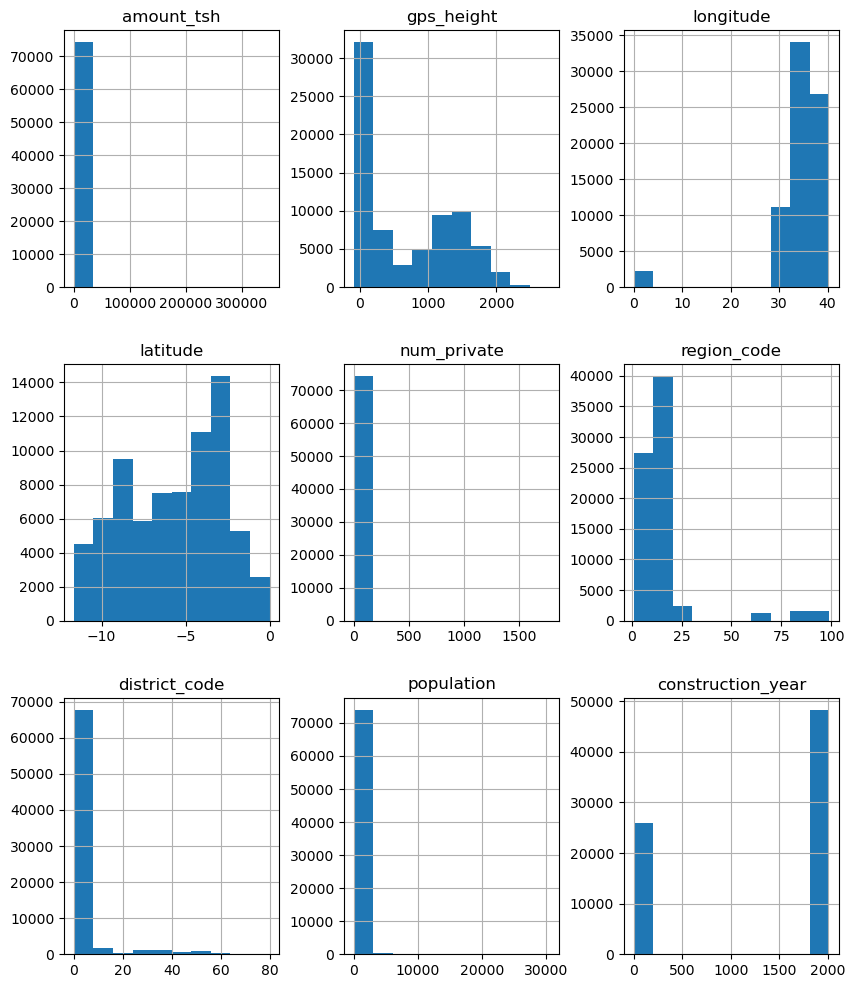

In [195]:
#histograma de las variables numéricas
plot = data.select_dtypes(include=np.number).hist(figsize=(10, 12))

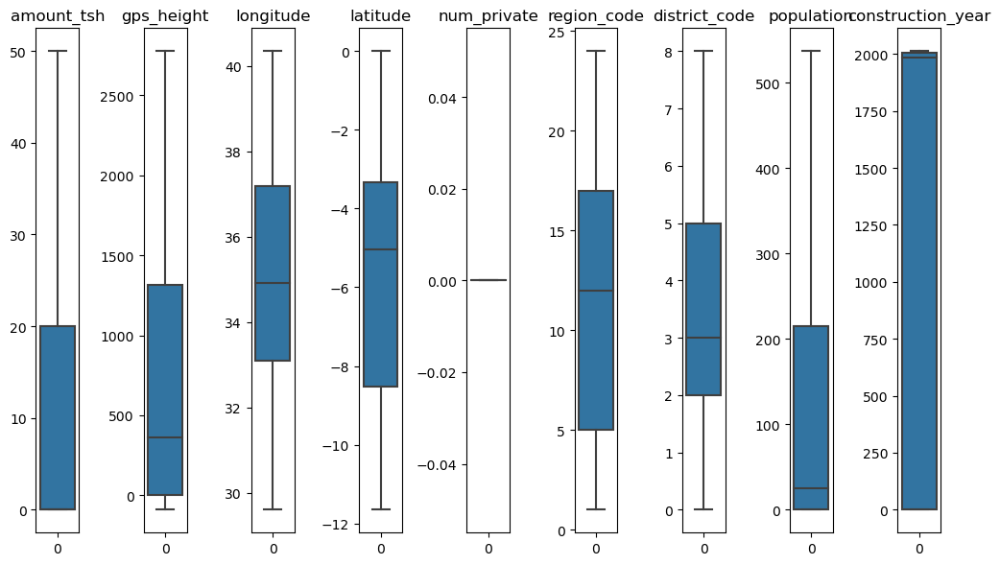

In [196]:
#boxplot de las variables numéricas
# Establece el tamaño de la figura
plt.figure(figsize=(10, 6))

# Itera a través de las columnas numéricas y crea subplots
for i, column in enumerate(data.select_dtypes(include=np.number).columns):
    plt.subplot(1, len(data.select_dtypes(include=np.number).columns), i + 1)
    sns.boxplot(data[column], showfliers=False)  # Oculta los valores atípicos
    plt.title(column)

plt.tight_layout()  # Ajusta el espaciado entre subplots
plt.show()

Para el análisis, hemos utilizado la librería ydata_profiling, pero como requiere de un tiempo de ejecución, la hemos dejado comentada para ser ejecutada a gusto propio. De todas formas, nuestras conclusiones están detalladas a continuación.

In [128]:

profile = ProfileReport(data, title="Profile Report Water Pumps")

In [129]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


-recorded_by has constant value ""	Constant

-public_meeting is highly imbalanced (56.2%)	Imbalance

-management_group is highly imbalanced (69.1%)	Imbalance

-water_quality is highly imbalanced (71.3%)	Imbalance

-quality_group is highly imbalanced (67.9%)	Imbalance

-funder has 4507 (6.1%) missing values	Missing

-installer has 4532 (6.1%) missing values	Missing

-public_meeting has 4155 (5.6%) missing values	Missing

-scheme_management has 4847 (6.5%) missing values	Missing

-scheme_name has 36052 (48.6%) missing values	Missing

-permit has 3793 (5.1%) missing values	Missing

-status_group has 14850 (20.0%) missing values	Missing

-amount_tsh is highly skewed (γ1 = 56.37002144)	Skewed

-num_private is highly skewed (γ1 = 91.3269825)	Skewed

-amount_tsh has 52049 (70.1%) zeros	Zeros

-gps_height has 25649 (34.5%) zeros	Zeros

-longitude has 2269 (3.1%) zeros	Zeros

-num_private has 73299 (98.7%) zeros	Zeros

-population has 26834 (36.1%) zeros	Zeros

-construction_year has 25969 (35.0%) zeros

In [197]:
#hemos encontrado dos columnas con metadata y etiquetas que son irrelevantes para el modelo
data.drop(columns=['date_recorded', 'recorded_by','wpt_name'], inplace=True)
#hemos encontrado las siguientes variables muy desequilibradas por lo que procedemos a su eliminación.
data.drop(columns=['public_meeting', 'management_group', 'water_quality','quality_group'], inplace=True)
#las siguienes variables tiene datosmuy sesgados por lo que también prescindimos de ellas
data.drop(columns=['amount_tsh','num_private'], inplace=True)
#Region code se puede eliminar puesto que ya tenemos la variable region, la cual parece no presentar ninguna anomalía
#data.region.value_counts()
data.drop(columns='region_code', inplace=True)

#la variable district code es categórica, el resto de tipos de variables parecen estar bien asignados
data.district_code = data.district_code.astype('object')

In [198]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74250 entries, 69572 to 68707
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   funder                 69743 non-null  object 
 1   gps_height             74250 non-null  int64  
 2   installer              69718 non-null  object 
 3   longitude              74250 non-null  float64
 4   latitude               74250 non-null  float64
 5   basin                  74250 non-null  object 
 6   subvillage             73780 non-null  object 
 7   region                 74250 non-null  object 
 8   district_code          74250 non-null  object 
 9   lga                    74250 non-null  object 
 10  ward                   74250 non-null  object 
 11  population             74250 non-null  int64  
 12  scheme_management      69403 non-null  object 
 13  scheme_name            38198 non-null  object 
 14  permit                 70457 non-null  object 
 15  con

In [199]:
import pandas as pd

# Supongamos que 'data' es el DataFrame de Pandas
# data = pd.DataFrame(...)

# Calcular el porcentaje de valores nulos por columna
null_percentage = data.isna().sum() / len(data) * 100

# Filtrar solo las columnas que tienen valores nulos
null_percentage = null_percentage[null_percentage > 0]

# Mostrar el porcentaje de valores nulos solo para las columnas con valores nulos
print(null_percentage)


funder                6.070034
installer             6.103704
subvillage            0.632997
scheme_management     6.527946
scheme_name          48.554882
permit                5.108418
status_group         20.000000
dtype: float64


### Estudio de variables con altos porcentajes de 0s

- Tras observar un mapa de la altitud de Tanzania, hemos observado que no es posible que gps_height == 0. 
- construction_year tampoco puede ser = 0
- No sabemos si los 0s population son legítimos

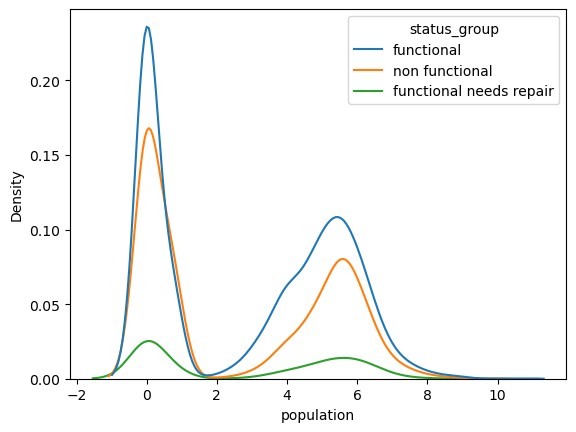

In [200]:
plot=sns.kdeplot(x=(np.log(data.population+1)), hue=data.status_group)

In [201]:
print(data[data.population <= 0].shape)
data[data.population <= 0].head()

(26834, 30)


,funder,gps_height,installer,longitude,latitude,basin,subvillage,region,district_code,lga,ward,population,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,payment,payment_type,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
19728,Action In A,0,Artisan,31.130847,-1.825359,Lake Victoria,Kyanyamisa,Kagera,1,Karagwe,Nyakasimbi,0,NaN,NaN,True,0,gravity,gravity,gravity,other,never pay,never pay,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
19816,Dwsp,0,DWSP,33.362410,-3.766365,Internal,Ishinabulandi,Shinyanga,3,Shinyanga Rural,Samuye,0,VWC,NaN,True,0,swn 80,swn 80,handpump,vwc,never pay,never pay,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
54551,Rwssp,0,DWE,32.620617,-4.226198,Lake Tanganyika,Nyawishi Center,Shinyanga,3,Kahama,Chambo,0,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,wug,unknown,unknown,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
53934,Wateraid,0,Water Aid,32.711100,-5.146712,Lake Tanganyika,Imalauduki,Tabora,6,Tabora Urban,Itetemia,0,VWC,NaN,True,0,india mark ii,india mark ii,handpump,vwc,never pay,never pay,seasonal,seasonal,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
46144,Isingiro Ho,0,Artisan,30.626991,-1.257051,Lake Victoria,Mkonomre,Kagera,1,Karagwe,Kaisho,0,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,never pay,never pay,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional


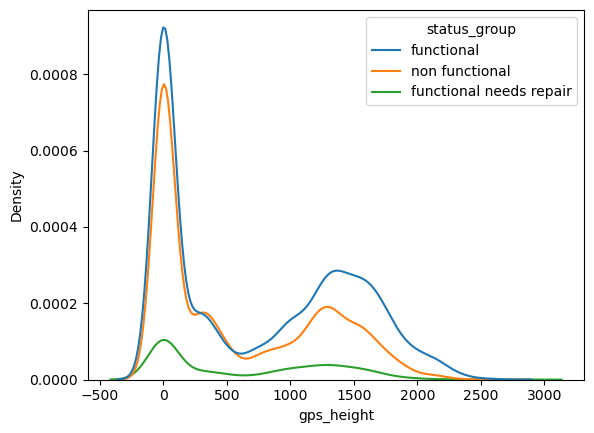

In [202]:
plot=sns.kdeplot(x=data.gps_height, hue=data.status_group)

In [203]:
print(data[data.gps_height <= 0].shape) 

(27530, 30)


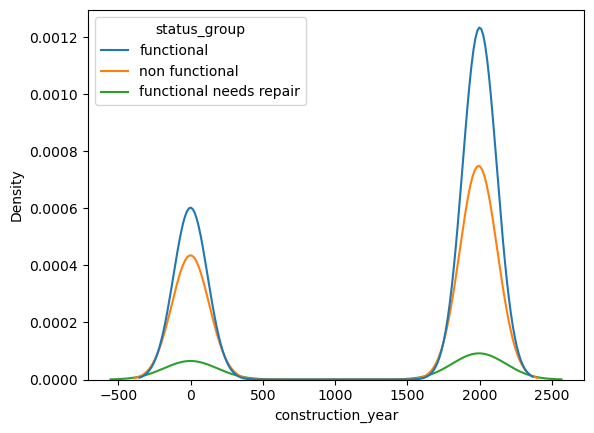

In [204]:
plot=sns.kdeplot(x=data.construction_year, hue=data.status_group)

Dada la distribución bimodal y especialmente por la ilegitimidad de los 0s en construction_year y gps_height, sospechamos que estos 0s correspondan a un patrón de valores faltantes. Por otro lado, no observamos ninguna iteracción alarmante respecto a la variable objetivo.

In [205]:
#declaramos como perdidos aquellos 0s que parecen corresponder a un patrón
condition = (data.population<=0)&(data.gps_height <= 0)&(data.construction_year <= 0)
data.loc[condition, 'population'] = np.nan

In [206]:
#pasamos a null el resto de 0s en construction_year y gps_height porque son ilegítimos

#data.gps_height.replace(0, np.nan, inplace=True)
data.gps_height.where(data.gps_height >0 , np.nan, inplace=True) #corregimos el error para declarar nulos los negativos también
data.construction_year.replace(0, np.nan, inplace=True)

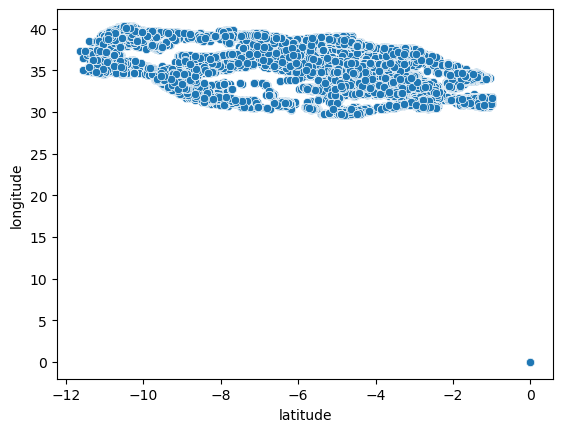

In [207]:
#longitud y latitud

plot=sns.scatterplot(x=data.latitude, y=data.longitude)

Esos 0s tienen toda la pinta de ser ilegítimos.

In [208]:
data[(data.latitude == -2*10**-8)&(data.longitude==0)][['longitude', 'latitude', 'region', 'subvillage', 'district_code', 'lga', 'ward', 'basin']]

,longitude,latitude,region,subvillage,district_code,lga,ward,basin
id,,,,,,,,
6091,0.0,-2.000000e-08,Shinyanga,Ibabachegu,1,Bariadi,Ikungulyabashashi,Lake Victoria
32376,0.0,-2.000000e-08,Mwanza,Center,6,Geita,Nyang'hwale,Lake Victoria
72678,0.0,-2.000000e-08,Shinyanga,Ilula,1,Bariadi,Chinamili,Lake Victoria
56725,0.0,-2.000000e-08,Shinyanga,Mahaha,1,Bariadi,Bunamhala,Lake Victoria
13042,0.0,-2.000000e-08,Mwanza,Nyamatala,2,Magu,Malili,Lake Victoria
...,...,...,...,...,...,...,...,...
30454,0.0,-2.000000e-08,Mwanza,Nyaweshi,6,Geita,Kharumwa,Lake Victoria
44766,0.0,-2.000000e-08,Mwanza,Busumabwi,1,Magu,Nkungulu,Lake Victoria
56279,0.0,-2.000000e-08,Mwanza,Madukani,2,Magu,Mkula,Lake Victoria


Estos valores en longitud y latitud parecen ilegítimos, puesto que pese a que las coordenadas son las mismas el resto de valores de localización son diferentes.

In [209]:
#revisamos que no esté asociado a Lake Victoria únicamente

data[(data.latitude > -0.00001)&(data.longitude==0)].basin.value_counts()

basin
Lake Victoria      2145
Lake Tanganyika     124
Name: count, dtype: int64

In [210]:
data.basin.value_counts() 

basin
Lake Victoria              12871
Pangani                    11143
Rufiji                      9987
Internal                    9642
Lake Tanganyika             8052
Wami / Ruvu                 7577
Lake Nyasa                  6332
Ruvuma / Southern Coast     5587
Lake Rukwa                  3059
Name: count, dtype: int64

In [211]:
#los declaramos perdidos
data.loc[(data.latitude == -2*10**-8) & (data.longitude == 0), ['longitude', 'latitude']] = np.nan

In [212]:
data[['longitude', 'latitude']].isna().sum() #se han declarado valores perdidos correctamente

longitude    2269
latitude     2269
dtype: int64

## funder, installer, alta cardinalidad

In [213]:
data.funder.nunique()

2139

In [214]:
data.installer.nunique()

2410

In [215]:
data.funder.value_counts(normalize=True).head()

funder
Government Of Tanzania    0.162009
Danida                    0.056020
Hesawa                    0.039889
Rwssp                     0.024418
World Bank                0.024390
Name: proportion, dtype: float64

In [216]:
data.installer.value_counts(normalize=True).head()

installer
DWE           0.311985
Government    0.032732
RWE           0.021487
Commu         0.019321
DANIDA        0.018718
Name: proportion, dtype: float64

No parece sencillo reagrupar las categorías minoritarias puesto que perderíamos demasiada información, así que trataremos de aplicar métodos de codificación que no aumenten demasiado la dimensionalidad como frequency encoding.

# Depuración

In [217]:
data_dep = data.copy(deep=True)

## Outliers

Llevamos a cabo un conteo de los valores que se consideran extremos según un consenso de dos criterios distintos. En primer lugar, se distingue si la variable es simétrica o no, para aplicar media + 3 sd o mediana + 8 mad, respectivamente, y que los valores que superen el umbral sean considerados atípicos.

In [218]:
import numpy as np
import pandas as pd

# Suponiendo que 'data_dep' es tu DataFrame y 'gestiona_outliers' es una función definida previamente
def gestiona_outliers(column):
    """
    Maneja los valores atípicos en una columna numérica.
    Reemplaza los valores atípicos con la mediana.
    """
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    column = np.where((column < lower_bound) | (column > upper_bound), column.median(), column)
    return column


In [219]:
# Aplica la función a todas las columnas numéricas en 'data_dep'
numerical_columns = data_dep.select_dtypes(include=np.number)
data_dep[numerical_columns.columns] = numerical_columns.apply(gestiona_outliers)

# Imprime un mensaje de éxito
print("Valores atípicos manejados correctamente.")

Valores atípicos manejados correctamente.


In [220]:
numerical_columns.head()

,gps_height,longitude,latitude,population,construction_year
id,,,,,
69572,1390.0,34.938093,-9.856322,109.0,1999.0
8776,1399.0,34.698766,-2.147466,280.0,2010.0
34310,686.0,37.460664,-3.821329,250.0,2009.0
67743,263.0,38.486161,-11.155298,58.0,1986.0
19728,NaN,31.130847,-1.825359,NaN,NaN


In [221]:
data_dep['population_log'] = np.log(data_dep.population + 1)

In [222]:
data_dep.select_dtypes(include=np.number).apply(lambda x: gestiona_outliers(x))

,gps_height,longitude,latitude,population,construction_year,population_log
id,,,,,,
69572,1390.0,34.938093,-9.856322,109.0,1999.0,4.700480
8776,1399.0,34.698766,-2.147466,280.0,2010.0,5.638355
34310,686.0,37.460664,-3.821329,250.0,2009.0,5.525453
67743,263.0,38.486161,-11.155298,58.0,1986.0,4.077537
19728,NaN,31.130847,-1.825359,NaN,NaN,NaN
...,...,...,...,...,...,...
39307,34.0,38.852669,-6.582841,20.0,1988.0,3.044522
18990,NaN,37.451633,-5.350428,150.0,1994.0,5.017280
28749,1476.0,34.739804,-4.585587,200.0,2010.0,5.303305


Parece que hemos logrado corregir el impacto de los valores extremos con la transformación logarítmica.

In [223]:
tablaCramer = pd.DataFrame(data_dep.apply(lambda x: cramers_v(x, data_dep['status_group'])), columns=['VCramer'])

# Ordena el DataFrame por 'VCramer' en orden descendente y aplica el gradiente de color
styled_table = tablaCramer.sort_values(by='VCramer', ascending=False).style.background_gradient(cmap='coolwarm')
styled_table

,VCramer
status_group,1.000000
subvillage,0.682880
scheme_name,0.593358
ward,0.469122
installer,0.363391
funder,0.356485
lga,0.311533
quantity_group,0.309240
quantity,0.309240
waterpoint_type,0.250426


In [ ]:
#suprimimos la variable population, ya que disponemos de population_log que nos da mejor resultado en la V de cramer

In [224]:
data_dep.drop(columns=['population'], inplace=True)

## Valores perdidos

In [225]:
target = data_dep.status_group
features = data_dep.drop(columns='status_group')


In [226]:
(features.isna().sum() / len(features)*100).sort_values(ascending=False) #porcentaje de missings por variable

scheme_name              48.554882
gps_height               37.077441
construction_year        34.975084
population_log           33.237710
scheme_management         6.527946
installer                 6.103704
funder                    6.070034
permit                    5.108418
longitude                 3.055892
latitude                  3.055892
subvillage                0.632997
ward                      0.000000
payment_type              0.000000
waterpoint_type_group     0.000000
waterpoint_type           0.000000
source_class              0.000000
source_type               0.000000
source                    0.000000
quantity_group            0.000000
quantity                  0.000000
payment                   0.000000
lga                       0.000000
management                0.000000
extraction_type_class     0.000000
basin                     0.000000
extraction_type           0.000000
region                    0.000000
district_code             0.000000
extraction_type_grou

In [54]:
#porcentaje de missings por observación
features['prop_missings'] = features.drop(columns=['amount_tsh_log', 'population_log']).apply(lambda x: x.isna().sum()/len(x)*100,axis=1)


features.prop_missings.describe()


count    74250.000000
mean         6.565696
std          6.945302
min          0.000000
25%          0.000000
50%          2.941176
75%         14.705882
max         32.352941
Name: prop_missings, dtype: float64

In [55]:
features.sort_values(by='prop_missings', ascending=False).head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,subvillage,region,district_code,lga,ward,population,public_meeting,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,amount_tsh_log,population_log,prop_missings
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
67675,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Mwamijondo,Shinyanga,1,Bariadi,Sakwe,NaN,NaN,NaN,NaN,False,NaN,nira/tanira,nira/tanira,handpump,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,32.352941
58037,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Shule Ya Msingi Sima,Shinyanga,4,Bariadi,Bariadi,NaN,NaN,NaN,NaN,False,NaN,other,other,other,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,other,unknown,hand pump,hand pump,NaN,NaN,32.352941
9846,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Mwa,Shinyanga,1,Bariadi,Bumera,NaN,NaN,NaN,NaN,False,NaN,nira/tanira,nira/tanira,handpump,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,32.352941
41614,NaN,NaN,NaN,NaN,NaN,NaN,Lake Victoria,Ng'Esha,Mwanza,1,Magu,Nkungulu,NaN,NaN,WUG,NaN,False,NaN,swn 80,swn 80,handpump,wug,user-group,unknown,unknown,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN,NaN,29.411765
6454,NaN,Community,NaN,NaN,NaN,NaN,Lake Victoria,Mbugani,Shinyanga,1,Bariadi,Nkololo,NaN,NaN,NaN,NaN,False,NaN,other,other,other,unknown,unknown,unknown,unknown,unknown,unknown,unknown,unknown,shallow well,shallow well,groundwater,other,other,NaN,NaN,29.411765


Tenemos registros con un 32% de valores desaparecidos, lo cual no parece excesivo. No vamos a eliminar ningún registro.

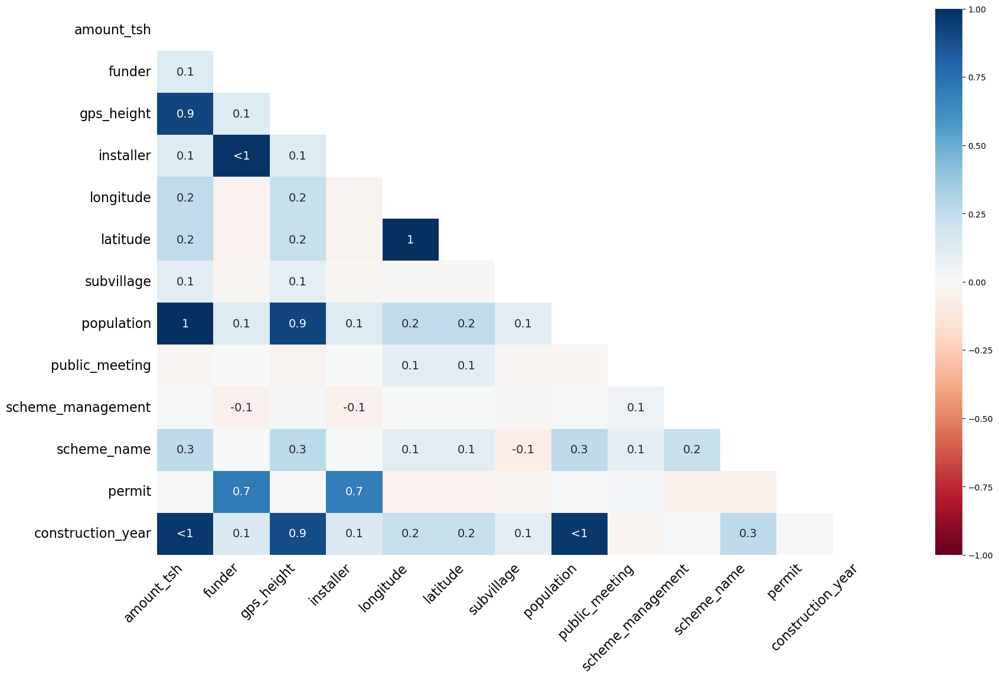

In [56]:
plot = msno.heatmap(features.drop(columns=['amount_tsh_log', 'population_log', 'prop_missings']))

<Figure size 1200x800 with 0 Axes>

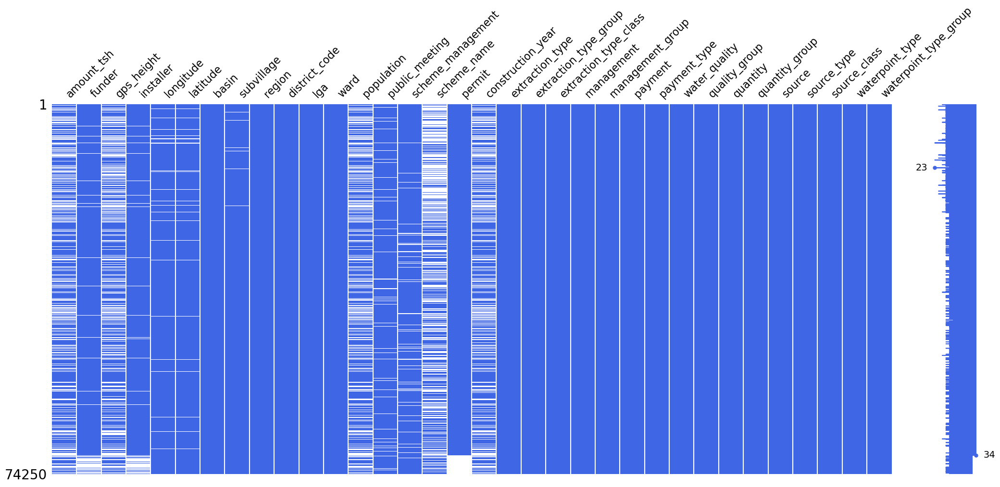

In [57]:
import missingno as msno
import matplotlib.pyplot as plt

# Asumiendo que 'features' es tu DataFrame y 'permit' es una de las columnas

# Elimina las columnas especificadas y ordena por 'permit' antes de visualizar la matriz de datos faltantes
features_dropped = features.drop(columns=['amount_tsh_log', 'population_log', 'prop_missings'])
features_sorted = features_dropped.sort_values(by='permit')

# Crea un gráfico de matriz de datos faltantes con color azul
plt.figure(figsize=(12, 8))
msno.matrix(features_sorted, color=(0.25, 0.4, 0.9))  # RGB para el color azul
plt.show()


- Longitude y latitude (los generamos nosotros previamente)
- La correlación entre categóricas nos indica que no es buena idea imputar por la moda, puesto que es probable que haya un patrón detrás de dichos valores perdidos.
- En cuanto a las numéricas, trataremos de utilizar algoritmos de imputación para intentar restaurar los valores a partir del resto de observaciones sin valores perdidos.
- scheme_name tiene muchos perdidos, pero la importancia que tiene frente a la variable objetivo nos dice que mejor no eliminarla.

### Categóricas

In [227]:
features.select_dtypes(exclude=np.number).isna().sum().sort_values(ascending=False).head(7) / len(features) *100

scheme_name          48.554882
scheme_management     6.527946
installer             6.103704
funder                6.070034
permit                5.108418
subvillage            0.632997
payment               0.000000
dtype: float64

In [228]:
features.scheme_name.value_counts(normalize=True)

scheme_name
K                       0.022462
Borehole                0.018430
Chalinze wate           0.013116
M                       0.012828
DANIDA                  0.012645
                          ...   
Mtunduru                0.000026
Jaduwaso                0.000026
LAMP water Supplying    0.000026
Njinjo water supply     0.000026
MIGA                    0.000026
Name: proportion, Length: 2867, dtype: float64

In [229]:
features.scheme_management.value_counts(normalize=True)

scheme_management
VWC                 0.661600
WUG                 0.093598
Water authority     0.057274
WUA                 0.051165
Water Board         0.049883
Parastatal          0.030604
Company             0.019322
Private operator    0.019106
Other               0.014351
SWC                 0.001772
Trust               0.001326
Name: proportion, dtype: float64

In [230]:
features.funder.value_counts(normalize=True).head(10)

funder
Government Of Tanzania    0.162009
Danida                    0.056020
Hesawa                    0.039889
Rwssp                     0.024418
World Bank                0.024390
Kkkt                      0.023271
World Vision              0.022397
Unicef                    0.018984
Tasaf                     0.016288
Dhv                       0.015270
Name: proportion, dtype: float64

In [231]:
features.installer.value_counts(normalize=True).head(10)

installer
DWE           0.311985
Government    0.032732
RWE           0.021487
Commu         0.019321
DANIDA        0.018718
KKKT          0.016065
Hesawa        0.015348
0             0.014057
TCRS          0.012723
CES           0.010973
Name: proportion, dtype: float64

In [233]:
features.permit.value_counts(normalize=True).head(10)

permit
True     0.689868
False    0.310132
Name: proportion, dtype: float64

Trataremos de rellenar la información faltante de las variables geográficas a partir de la información que nos proporciona el resto.

In [234]:
vista = features[['longitude', 'latitude', 'region', 'subvillage', 'district_code', 'lga', 'ward', 'basin']]

vista.sort_values(by=['district_code', 'lga', 'ward', 'basin', 'region']).tail(10)

,longitude,latitude,region,subvillage,district_code,lga,ward,basin
id,,,,,,,,
38036,34.096322,-3.946261,Shinyanga,Buzinza,80,Kishapu,Masanga,Internal
71337,34.097803,-3.948488,Shinyanga,Buzinza,80,Kishapu,Masanga,Internal
2510,34.014346,-3.956308,Shinyanga,Isemelo,80,Kishapu,Masanga,Internal
18435,34.008816,-3.960595,Shinyanga,Dodoma,80,Kishapu,Masanga,Internal
63060,34.009985,-3.954908,Shinyanga,Isemelo,80,Kishapu,Masanga,Internal
39959,34.102593,-3.951671,Shinyanga,Timbwe,80,Kishapu,Masanga,Internal
38236,34.006561,-3.969176,Shinyanga,Dodoma,80,Kishapu,Masanga,Internal
19608,34.007546,-3.952260,Shinyanga,Isemelo,80,Kishapu,Masanga,Internal
21180,34.019720,-3.904369,Shinyanga,Munge,80,Kishapu,Masanga,Internal


In [235]:
cols = ['region', 'subvillage', 'district_code', 'lga', 'ward', 'basin']

for col in cols:
    print(col, features[col].nunique())

region 21
subvillage 21425
district_code 20
lga 125
ward 2098
basin 9


In [236]:
vista[vista.subvillage.isna()].longitude.isna().sum()

0

In [237]:
vista[vista.subvillage.isna()].latitude.isna().sum()

0

Parece ser que ahí donde subvillage tiene valores perdidos, latitud y longitud no, por lo tanto podríamos tratar de rellenar la información a partir de estas dos variables principalmente.

In [238]:
vista.sort_values(by='subvillage').tail(10)

,longitude,latitude,region,subvillage,district_code,lga,ward,basin
id,,,,,,,,
15388,36.827965,-6.310269,Dodoma,NaN,3,Kongwa,Mlali,Wami / Ruvu
70675,36.643960,-6.069606,Dodoma,NaN,3,Kongwa,Kibaigwa,Wami / Ruvu
17416,36.659797,-6.269507,Dodoma,NaN,3,Kongwa,Iduo,Wami / Ruvu
70214,36.624861,-6.357358,Dodoma,NaN,3,Kongwa,Chamkoroma,Wami / Ruvu
9890,36.572800,-6.244027,Dodoma,NaN,3,Kongwa,Sagara,Wami / Ruvu
67658,36.481201,-5.716899,Dodoma,NaN,3,Kongwa,Mkoka,Wami / Ruvu
9207,36.709281,-6.031253,Dodoma,NaN,3,Kongwa,Njoge,Wami / Ruvu
61837,36.642242,-6.249101,Dodoma,NaN,3,Kongwa,Iduo,Wami / Ruvu
23718,36.704039,-6.023288,Dodoma,NaN,3,Kongwa,Njoge,Wami / Ruvu


Para tratar de recuperar los valores perdidos en subvillage, ordenaremos el data set a partir de latitud y longitud, y utilizaremos el método forward fill. Para latitud y longitud, ordenaremos el set de datos de acuerdo a las variables geográficas (primero con base en las de mayor granularidad) e interpolaremos.

In [239]:
features.sort_index(inplace=True)

In [240]:
features.head()

,funder,gps_height,installer,longitude,latitude,basin,subvillage,region,district_code,lga,ward,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,payment,payment_type,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,population_log
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,Tasaf,NaN,TASAF,33.125828,-5.118154,Lake Tanganyika,Majengo,Tabora,3,Uyui,Igalula,VWC,NaN,True,NaN,afridev,afridev,handpump,vwc,unknown,unknown,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,NaN
1,Shipo,1978.0,SHIPO,34.770717,-9.395642,Rufiji,Magoda C,Iringa,4,Njombe,Uwemba,NaN,NaN,False,2008.0,other - rope pump,rope pump,rope pump,vwc,never pay,never pay,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,3.044522
2,Lvia,NaN,LVIA,36.115056,-6.279268,Wami / Ruvu,Songambele,Dodoma,4,Chamwino,Msamalo,VWC,Mgun,True,NaN,mono,mono,motorpump,vwc,pay per bucket,per bucket,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,NaN
3,Germany Republi,1639.0,CES,37.147432,-3.187555,Pangani,Urereni,Kilimanjaro,5,Hai,Masama Magharibi,Water Board,Losaa-Kia water supply,True,1999.0,gravity,gravity,gravity,water board,pay per bucket,per bucket,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,3.258097
4,Cmsr,NaN,CMSR,36.164893,-6.099289,Wami / Ruvu,Maata A,Dodoma,4,Chamwino,Majeleko,VWC,NaN,True,NaN,nira/tanira,nira/tanira,handpump,vwc,unknown,unknown,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,NaN


In [241]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74250 entries, 0 to 74249
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   funder                 69743 non-null  object 
 1   gps_height             46720 non-null  float64
 2   installer              69718 non-null  object 
 3   longitude              71981 non-null  float64
 4   latitude               71981 non-null  float64
 5   basin                  74250 non-null  object 
 6   subvillage             73780 non-null  object 
 7   region                 74250 non-null  object 
 8   district_code          74250 non-null  object 
 9   lga                    74250 non-null  object 
 10  ward                   74250 non-null  object 
 11  scheme_management      69403 non-null  object 
 12  scheme_name            38198 non-null  object 
 13  permit                 70457 non-null  object 
 14  construction_year      48281 non-null  float64
 15  extract

In [242]:
#rellenamos los datos faltantes de subvillage
features.subvillage = features.sort_values(by=['longitude', 'latitude', 'ward', 'lga', 'district_code', 'basin'], ascending=True).subvillage.fillna(method='ffill').sort_index()

In [243]:
#interpolamos los datos faltantes de longitude y latitude ordenando los datos por el resto de variables geográficas
features.longitude = features.sort_values(by=['subvillage', 'ward', 'lga', 'district_code', 'basin'], ascending=True).longitude.interpolate(method='linear').sort_index()
features.latitude = features.sort_values(by=['subvillage', 'ward', 'lga', 'district_code', 'basin'], ascending=True).latitude.interpolate(method='linear').sort_index()

Text(0.5, 1.0, 'Before interpolation')

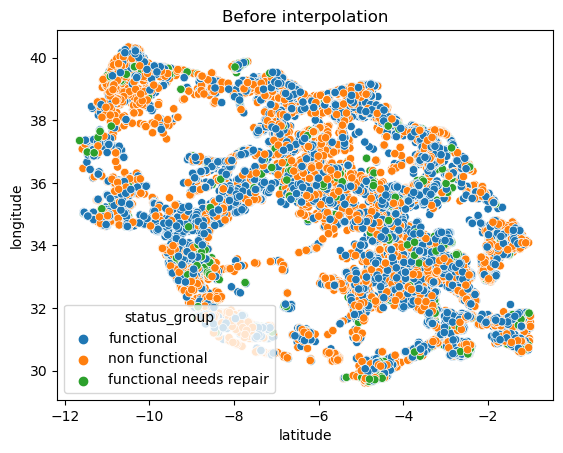

In [249]:
plot= sns.scatterplot(x=data.latitude, y=data.longitude, hue=data.status_group)
plt.title('Before interpolation')

Text(0.5, 1.0, 'After interpolation')

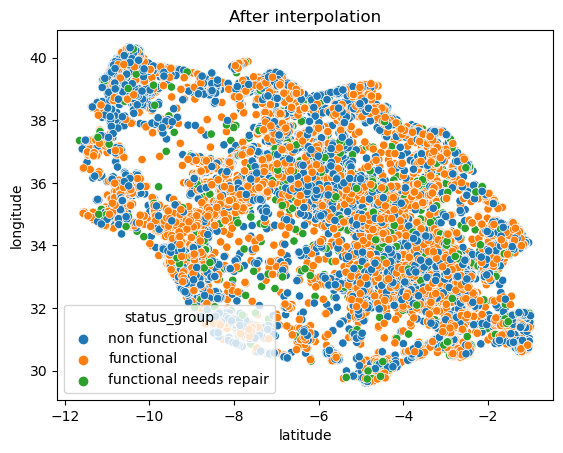

In [245]:
plot= sns.scatterplot(x=features.latitude, y=features.longitude, hue=target.sort_index())
plt.title('After interpolation')

# Codificación

Antes de tratar los valores numéricos perdidos, codificaremos las variables categóricas para que sean útiles para métodos de imputación multivariante.

In [250]:
for column in features.select_dtypes(exclude=np.number).columns.to_list():
    print(column, features[column].nunique())

funder 2139
installer 2410
basin 9
subvillage 21425
region 21
district_code 20
lga 125
ward 2098
scheme_management 11
scheme_name 2867
permit 2
extraction_type 18
extraction_type_group 13
extraction_type_class 7
management 12
payment 7
payment_type 7
quantity 5
quantity_group 5
source 10
source_type 7
source_class 3
waterpoint_type 7
waterpoint_type_group 6


Proponemos codificar por frecuencia.

Antes de codificar, observaremos el número de clases que nos quedarían después de la codificación por frecuencia. En caso de que se pierda mucha información, consideraríamos otros tipos de codificación para determinadas variables.

In [251]:
import category_encoders as ce

# Asumiendo que 'features' es tu DataFrame original con características categóricas y numéricas
# Inicializa el codificador de recuento
encoder = ce.CountEncoder(normalize=True)

# Selecciona solo las columnas categóricas de 'features' y aplica la codificación de frecuencia
freq_enc = encoder.fit_transform(features.select_dtypes(exclude=np.number))

# Listas para almacenar los nombres de las columnas
frec_cols = []
other_cols = []

# Itera sobre cada columna en el DataFrame codificado por frecuencia
for column in freq_enc.columns.to_list():
    # Compara el número de valores únicos antes y después de la codificación
    original_unique = features[column].nunique()
    encoded_unique = freq_enc[column].nunique()
    print(f"{column}: Original -> {original_unique}, Codificado -> {encoded_unique}")
    
    # Agrega la columna a la lista correspondiente
    if original_unique == encoded_unique:
        frec_cols.append(column)
    else:
        other_cols.append(column)

# Imprime las listas de columnas
print("Columnas con el mismo número de valores únicos después de la codificación:", frec_cols)
print("Columnas con un número diferente de valores únicos después de la codificación:", other_cols)


funder: Original -> 2139, Codificado -> 171
installer: Original -> 2410, Codificado -> 168
basin: Original -> 9, Codificado -> 9
subvillage: Original -> 21425, Codificado -> 109
region: Original -> 21, Codificado -> 21
district_code: Original -> 20, Codificado -> 20
lga: Original -> 125, Codificado -> 120
ward: Original -> 2098, Codificado -> 156
scheme_management: Original -> 11, Codificado -> 12
scheme_name: Original -> 2867, Codificado -> 128
permit: Original -> 2, Codificado -> 3
extraction_type: Original -> 18, Codificado -> 18
extraction_type_group: Original -> 13, Codificado -> 13
extraction_type_class: Original -> 7, Codificado -> 7
management: Original -> 12, Codificado -> 12
payment: Original -> 7, Codificado -> 7
payment_type: Original -> 7, Codificado -> 7
quantity: Original -> 5, Codificado -> 5
quantity_group: Original -> 5, Codificado -> 5
source: Original -> 10, Codificado -> 10
source_type: Original -> 7, Codificado -> 7
source_class: Original -> 3, Codificado -> 3
wat

In [252]:
other_cols

['funder',
 'installer',
 'subvillage',
 'lga',
 'ward',
 'scheme_management',
 'scheme_name',
 'permit']

Para 'lga' pensamos que como solo se pierden 5 categorías podemos seguir adelante con la codificación por frecuencia. Para el resto, aplicaremos label encoding.

In [253]:
other_cols.remove('lga')
frec_cols.append('lga')

In [254]:
encoder = ce.CountEncoder(normalize=True, cols=frec_cols)
features = encoder.fit_transform(features)

In [255]:
le = preprocessing.LabelEncoder()

for column in other_cols:
    features[column] = le.fit_transform(features[column])

In [263]:
encoding_map = {'functional': 0, 'functional needs repair': 1, 'non functional': 2}

target = target.map(encoding_map)

## Numéricas

In [258]:
(features.select_dtypes(include=np.number).isna().sum() / len(features)*100).sort_values(ascending=False).head(6)

gps_height               37.077441
construction_year        34.975084
population_log           33.237710
longitude                 0.000000
latitude                  0.000000
waterpoint_type_group     0.000000
dtype: float64

Vamos a utilizar el método iterative imputer, ya que puese ser más preciso que el método random imputer, ya que tiene en cuenta la correlaciónn entre las características, aunque puede ser más lento, debido a su naturaleza iterativa. 

In [273]:
imputer_itImp = skl_imp.IterativeImputer(random_state=0, max_iter=20, n_nearest_features=10)

In [275]:
df[['construction_year', 'gps_height']].describe()

,construction_year,gps_height
count,74250.000000,74250.000000
mean,1298.463650,665.667313
std,952.349375,692.761033
min,0.000000,-90.000000
25%,0.000000,0.000000
50%,1986.000000,364.000000
75%,2004.000000,1317.000000
max,2013.000000,2777.000000


In [282]:
features_itImp_imputed[['construction_year', 'gps_height', 'population_log']].describe()

,construction_year,gps_height,population_log
count,74250.000000,74250.000000,74250.000000
mean,1996.822563,1160.229999,4.075312
std,10.208639,544.251586,1.717979
min,1960.000000,-139.893147,0.000000
25%,1993.000000,794.000000,3.548457
50%,1997.895348,1312.000000,4.495851
75%,2004.000000,1551.369843,5.303305
max,2013.000000,2777.000000,6.590301


In [120]:
features_rand_imputed = imputer_rand.fit(features).transform(features)

In [283]:
features = pd.DataFrame(imputer_itImp.fit_transform(features),columns=features.columns)

In [284]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74250 entries, 0 to 74249
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   funder                 74250 non-null  float64
 1   gps_height             74250 non-null  float64
 2   installer              74250 non-null  float64
 3   longitude              74250 non-null  float64
 4   latitude               74250 non-null  float64
 5   basin                  74250 non-null  float64
 6   subvillage             74250 non-null  float64
 7   region                 74250 non-null  float64
 8   district_code          74250 non-null  float64
 9   lga                    74250 non-null  float64
 10  ward                   74250 non-null  float64
 11  scheme_management      74250 non-null  float64
 12  scheme_name            74250 non-null  float64
 13  permit                 74250 non-null  float64
 14  construction_year      74250 non-null  float64
 15  ex

# Modelización

Antes que nada, vamos a realizar pruebas con los tres data sets que hemos generado para tratar de averiguar cuál podría funcionar mejor.

In [286]:

data_itImp = features.join(target_enc)
test_itImp = data_itImp.iloc[indices_test].drop(columns='status_group')
data_itImp.drop(index=indices_test, inplace=True)

In [287]:
#pequeña función que nos da toda la información que queremos directamente en una celda

def probar_data_rf(data, y_col_name):
    X_train, X_test, y_train, y_test = train_test_split(data.drop(y_col_name,axis=1),
                                                        data[y_col_name],
                                                        test_size=0.3,
                                                        random_state=42,
                                                        stratify = data[y_col_name])

    model = RandomForestClassifier(random_state=42)
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)

    print(saca_metricas(y_test, y_pred, y_proba))
    print(classification_report(y_test, y_pred))

    feat_importances = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=True, inplace=True)
    plot = feat_importances.plot(kind='barh', figsize=(8,6))
    plt.show()
    return model

matriz de confusión
[[5649  204  599]
 [ 452  285  126]
 [ 949   71 3545]]
accuracy
0.7978956228956229
precision
0.7911577551240309
recall
0.7978956228956229
f1
0.7919073862938889
ROC-AUC OvR: 
0.8910451876586958
ROC-AUC OvO: 
0.8761913336737243
None
              precision    recall  f1-score   support

         0.0       0.80      0.88      0.84      6452
         1.0       0.51      0.33      0.40       863
         2.0       0.83      0.78      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.71      0.66      0.68     11880
weighted avg       0.79      0.80      0.79     11880



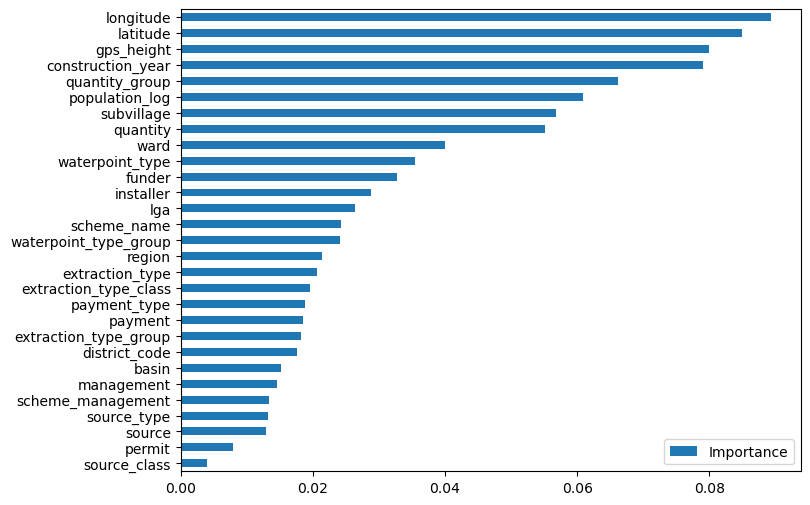

In [288]:
data_itImp_model = probar_data_rf(data_itImp, 'status_group')

In [294]:
def cross_validation(model, data, y_name):
    results = cross_val_score(estimator=model, X=data.drop(columns=y_name), y=data[y_name], cv=5, scoring='accuracy')
    print(results.mean())
    print(results.std())
    return results

In [295]:
cross_validation(data_itImp_model, data_itImp, 'status_group')

0.8051683501683501
0.002017815650029961


array([0.80841751, 0.80328283, 0.80563973, 0.80572391, 0.80277778])

## Predicción 1

In [296]:
model1 = RandomForestClassifier(random_state=42).fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = model1.predict(test_itImp)                                

In [297]:
primera_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

In [298]:
reverse_map = {v: k for k, v in encoding_map.items()}
primera_pred.status_group = primera_pred.status_group.map(reverse_map)

In [299]:
primera_pred.to_csv('primer_intento.csv', index=False)

 #### Puntuación DrivenData :
 

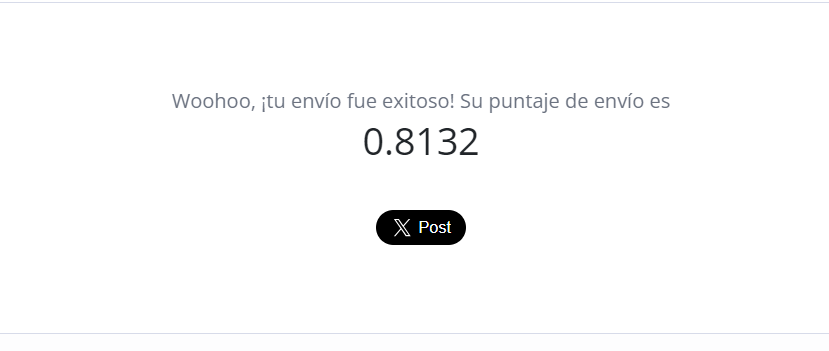

## Estandarización de los datos

Vamos a probar a estandarizar los datos para observar si logramos una mejora en el modelo.

In [300]:
#introducimos cambios a la función que estábamos usando para poder utilizarla en esta fase

def probar_modelo(data, y_col_name, model):
    X_train, X_test, y_train, y_test = train_test_split(data.drop(y_col_name,axis=1),
                                                        data[y_col_name],
                                                        test_size=0.2,
                                                        random_state=42,
                                                        stratify = data[y_col_name])

    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)

    print(saca_metricas(y_test, y_pred, y_proba))
    print(classification_report(y_test, y_pred))

In [301]:
a_escalar = ['gps_height', 'longitude', 'latitude', 'construction_year', 'population_log']

In [302]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

pipeline = Pipeline([
    ("scaler", ct),
    ("rf", RandomForestClassifier(random_state=42))
])

probar_modelo(data_itImp, 'status_group', pipeline)

matriz de confusión
[[5678  186  588]
 [ 455  282  126]
 [ 949   67 3549]]
accuracy
0.8004208754208754
precision
0.7936199798494529
recall
0.8004208754208754
f1
0.7939616453451106
ROC-AUC OvR: 
0.8895414347759281
ROC-AUC OvO: 
0.874607136073036
None
              precision    recall  f1-score   support

         0.0       0.80      0.88      0.84      6452
         1.0       0.53      0.33      0.40       863
         2.0       0.83      0.78      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.66      0.68     11880
weighted avg       0.79      0.80      0.79     11880



## Comparación de modelos con diferente hiperparámetros

Hemos comentado los GridSearch que hemos utilizado porque necesitan mucho tiempo de ejecución, pero hemos dejado capturas con los resultados obtenidos en cada una.

In [305]:
# Importar los clasificadores
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC


param_grid = {
    'tree': {
        'model': DecisionTreeClassifier(random_state=42),
        'params': {
            'min_samples_split': [2, 6]
        }
    },
    'rf': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [50, 100, 200],
            'max_depth': [None, 5],
            'max_features': ['sqrt', 'log2']
        }
    },
    'xgb_clf': {
        'model': XGBClassifier(random_state=42, verbosity=0),
        'params': {
            'learning_rate': [0.01, 0.05, 0.2],
            'n_estimators': [50, 100, 300]
        }
    },
    'SVC': {
        'model': SVC(random_state=42),
        'params': {
            'C': [1, 5, 10],
        }
    },
    'bagging_clf': {
        'model': BaggingClassifier(random_state=42),
        'params': {
            'n_estimators': [10, 50, 100],
            'max_samples': [0.5, 0.8, 1.0],
            'max_features': [0.5, 0.8, 1.0]
        }
    },
    'voting_clf': {
        'model': VotingClassifier(estimators=[
            ('rf', RandomForestClassifier(random_state=42)),
            ('xgb', XGBClassifier(random_state=42, verbosity=0))
        ], voting='soft'),
        'params': {}
    },
    'ada_boost_clf': {
        'model': AdaBoostClassifier(random_state=42),
        'params': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.05, 0.1]
        }
    }
}

# Imprimir el diccionario
for model_name, model_info in modelos.items():
    print(f"Modelo: {model_name}")
    print(f"Clasificador: {model_info['model']}")
    print(f"Hiperparámetros: {model_info['params']}\n")


Modelo: tree
Clasificador: DecisionTreeClassifier(random_state=42)
Hiperparámetros: {'min_samples_split': [2, 6]}

Modelo: rf
Clasificador: RandomForestClassifier(random_state=42)
Hiperparámetros: {'n_estimators': [50, 100, 200], 'max_depth': [None, 5], 'max_features': ['sqrt', 'log2']}

Modelo: xgb_clf
Clasificador: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None

In [306]:
for model_name, mp in param_grid.items():
    print('MODELO', model_name)

    # Initialize HalvingGridSearchCV
    clf = HalvingGridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)

    # Fit the model
    clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

    # Append scores to the list
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

# Create a DataFrame from the scores
df = pd.DataFrame(scores, columns=['model', 'best_score', 'best_params'])

MODELO tree
n_iterations: 1
n_required_iterations: 1
n_possible_iterations: 1
min_resources_: 59400
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 2
n_resources: 59400
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO rf
n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 6600
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 12
n_resources: 6600
Fitting 3 folds for each of 12 candidates, totalling 36 fits
----------
iter: 1
n_candidates: 4
n_resources: 19800
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 2
n_candidates: 2
n_resources: 59400
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO xgb_clf
n_iterations: 3
n_required_iterations: 3
n_possible_iterations: 3
min_resources_: 6600
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 9
n_resources: 6600
Fitting

Visto los resultados, decidimos descartar SVC y el árbol de decisiones. Seguiremos probando hiperparámetros con RandomForest y XGBoost.

In [312]:
df= pd.DataFrame(scores, columns=['model', 'best_score', 'best_params'])

# Ordena el DataFrame por 'best_score' en orden descendente
df_sorted = df.sort_values(by='best_score', ascending=False)

# Muestra los cuatro mejores puntajes
top_four_scores = df_sorted.head(4)
top_four_scores 

,model,best_score,best_params
5,voting_clf,0.808973,{}
4,bagging_clf,0.807222,"{'max_features': 0.5, 'max_samples': 0.5, 'n_e..."
1,rf,0.802306,"{'max_depth': None, 'max_features': 'log2', 'n..."
2,xgb_clf,0.788754,"{'learning_rate': 0.05, 'n_estimators': 300}"


In [313]:
param_grid2 = {
    'rf': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [300, 400],
            'max_features': ['log2'],
            'min_samples_split': [2, 4, 6]
        }
    },
    'xgb_clf': {
        'model': XGBClassifier(random_state=42, verbosity=0),
        'params': {
            'learning_rate': [0.3],
            'n_estimators': [200, 300, 400],
            'max_depth': [3, 6, 10],
            'subsample': [0.6, 0.8, 1.0]
        }
    },
    'voting_clf': {
        'model': VotingClassifier(estimators=[
            ('rf', RandomForestClassifier(random_state=42)),
            ('xgb', XGBClassifier(random_state=42, verbosity=0))
        ], voting='soft'),
        'params': {}
    },
    'bagging_clf': {
        'model': BaggingClassifier(random_state=42),
        'params': {
            'n_estimators': [10, 50, 100],
            'max_samples': [0.5, 0.8, 1.0],
            'max_features': [0.5, 0.8, 1.0]
        }
    }
}


In [314]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
import pandas as pd

scores = []

for model_name, mp in param_grid2.items():
    print('MODELO', model_name)

    clf = HalvingGridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    
    # Asegúrate de que 'data_itImp' sea tu DataFrame con las características y 'status_group' como la variable objetivo
    clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
    
df2 = pd.DataFrame(scores, columns=['model', 'best_score', 'best_params'])

# Imprime el DataFrame con los mejores puntajes
print(df2)


MODELO rf
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 19800
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 6
n_resources: 19800
Fitting 3 folds for each of 6 candidates, totalling 18 fits
----------
iter: 1
n_candidates: 2
n_resources: 59400
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO xgb_clf
n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 2200
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 27
n_resources: 2200
Fitting 3 folds for each of 27 candidates, totalling 81 fits
----------
iter: 1
n_candidates: 9
n_resources: 6600
Fitting 3 folds for each of 9 candidates, totalling 27 fits
----------
iter: 2
n_candidates: 3
n_resources: 19800
Fitting 3 folds for each of 3 candidates, totalling 9 fits
----------
iter: 3
n_candidates: 1
n_resources: 59400
Fitting 3 folds for each of 1 candidates, totalling 3 

Realizaremos otra iteración para ver si logramos encontrar aún mejores parámetros.

In [315]:
df2

,model,best_score,best_params
0,rf,0.808266,"{'max_features': 'log2', 'min_samples_split': ..."
1,xgb_clf,0.795488,"{'learning_rate': 0.3, 'max_depth': 10, 'n_est..."
2,voting_clf,0.809394,{}
3,bagging_clf,0.807811,"{'max_features': 0.5, 'max_samples': 0.5, 'n_e..."


In [336]:
param_grid3 = {
    'rf': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [300, 400],
            'max_features': ['log2'],
            'min_samples_split': [2, 4, 6]
        }
    },
    'xgb_clf': {
        'model': XGBClassifier(random_state=42, verbosity=0),
        'params': {
            'learning_rate': [0.3],
            'n_estimators': [200, 300, 400],
            'max_depth': [3, 6, 10],
            'subsample': [0.6, 0.8, 1.0]
        }
    },
    'voting_clf': {
        'model': VotingClassifier(estimators=[
            ('rf', RandomForestClassifier(random_state=42)),
            ('xgb', XGBClassifier(random_state=42, verbosity=0))
        ], voting='soft'),
        'params': {}
    },
    'bagging_clf': {
        'model': BaggingClassifier(random_state=42),
        'params': {
            'n_estimators': [10, 50, 100],
            'max_samples': [0.5, 0.8, 1.0],
            'max_features': [0.5, 0.8, 1.0]
        }
    }
}


In [317]:
scores = []

for model_name, mp in param_grid3.items():
    print('MODELO', model_name)

    clf = HalvingGridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    
    # Asegúrate de que 'data_itImp' sea tu DataFrame con las características y 'status_group' como la variable objetivo
    clf.fit(data_itImp.drop(columns='status_group'), data_itImp.status_group)

    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
    
df3 = pd.DataFrame(scores, columns=['model', 'best_score', 'best_params'])

# Imprime el DataFrame con los mejores puntajes
print(df3)


MODELO rf
n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 19800
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 6
n_resources: 19800
Fitting 3 folds for each of 6 candidates, totalling 18 fits
----------
iter: 1
n_candidates: 2
n_resources: 59400
Fitting 3 folds for each of 2 candidates, totalling 6 fits
MODELO xgb_clf
n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 2200
max_resources_: 59400
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 27
n_resources: 2200
Fitting 3 folds for each of 27 candidates, totalling 81 fits
----------
iter: 1
n_candidates: 9
n_resources: 6600
Fitting 3 folds for each of 9 candidates, totalling 27 fits
----------
iter: 2
n_candidates: 3
n_resources: 19800
Fitting 3 folds for each of 3 candidates, totalling 9 fits
----------
iter: 3
n_candidates: 1
n_resources: 59400
Fitting 3 folds for each of 1 candidates, totalling 3 

In [326]:
df3

,model,best_score,best_params
0,rf,0.807912,"{'max_features': 'log2', 'min_samples_split': ..."
1,xgb_clf,0.802609,"{'learning_rate': 0.3, 'max_depth': 6, 'n_esti..."
2,voting_clf,0.809259,{}
3,bagging_clf,0.805354,"{'max_features': 0.5, 'max_samples': 1.0, 'n_e..."


In [328]:
df3.best_params[0]

{'max_features': 'log2', 'min_samples_split': 6, 'n_estimators': 400}

In [329]:
df3.best_params[1]

{'learning_rate': 0.3, 'max_depth': 6, 'n_estimators': 200, 'subsample': 1.0}

In [330]:
df3.best_params[3]

{'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 100}

# Predicción 2

In [342]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

model2 = Pipeline([
    ("scaler", ct),
    ("rf", RandomForestClassifier(max_features= 'log2', min_samples_split= 6, n_estimators= 400, random_state=42, n_jobs=-1))
])

model2.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = model2.predict(test_itImp)

segunda_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
segunda_pred.status_group = segunda_pred.status_group.map(reverse_map)

segunda_pred.to_csv('segundo_intento.csv', index=False)

#### Puntuación DrivenData


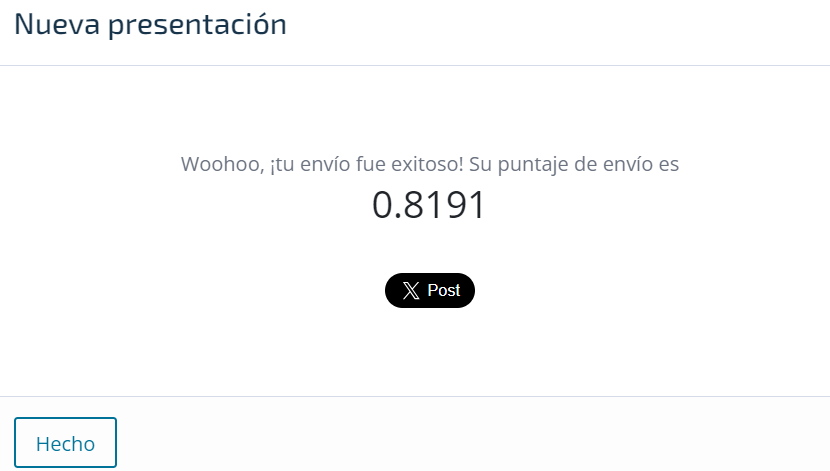

# Predicción 3

In [ ]:
# Define the column transformer
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

# Define the model pipeline with BaggingClassifier
model3 = Pipeline([
    ("transformer", ct),
    ("bagging", BaggingClassifier(
        base_estimator=RandomForestClassifier(max_features='log2', min_samples_split=6, n_estimators=400, random_state=42, n_jobs=-1),
        n_estimators=10, # Number of base estimators in the ensemble
        random_state=42,
        n_jobs=-1
    ))
])

# Fit the model
model3.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])

# Make predictions
y_pred = model3.predict(test_itImp)

# Create a DataFrame with predictions
tercera_pred = pd.DataFrame(data=zip(indices_test, y_pred), columns=['id', 'status_group'])

# Map the encoded labels back to original labels
reverse_map = {v: k for k, v in encoding_map.items()}
segunda_pred['status_group'] = segunda_pred['status_group'].map(reverse_map)

# Save the predictions to a CSV file
tercera_pred.to_csv('tercer_intento.csv', index=False)


#### Puntuación DrivenData:

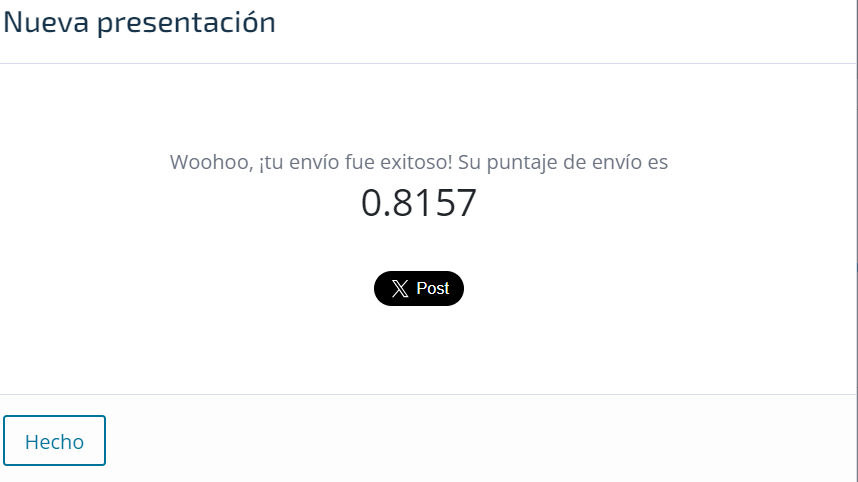

In [353]:
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier

param_grid4 = {
    'rf': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [400, 500],
            'max_features': ['log2'],
            'min_samples_split': [6, 8]
        }
    },
    'bagg_clf': {
        'model': BaggingClassifier(random_state=42),
        'params': {
            'n_estimators': [100, 400],
            'max_features': [0.2, 0.8, 1.0]
        }
    }
}


In [354]:
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Asumiendo que 'data_itImp' es tu DataFrame y 'param_grid4' es tu grid de parámetros
scores = []

# Itera sobre cada modelo y sus parámetros en el grid
for model_name, mp in param_grid4.items():
    print('Evaluando modelo:', model_name)
    clf = GridSearchCV(mp['model'], mp['params'], cv=3, return_train_score=False, verbose=1, n_jobs=-1)
    clf.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

# Crea un DataFrame con los resultados

df4 = pd.DataFrame(scores, columns=['model', 'best_score', 'best_params'])
df4

Evaluando modelo: rf
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Evaluando modelo: bagg_clf
Fitting 3 folds for each of 6 candidates, totalling 18 fits


,model,best_score,best_params
0,rf,0.807694,"{'max_features': 'log2', 'min_samples_split': ..."
1,bagg_clf,0.801330,"{'max_features': 0.8, 'n_estimators': 400}"


In [362]:
df4

,model,best_score,best_params
0,rf,0.807694,"{'max_features': 'log2', 'min_samples_split': ..."
1,bagg_clf,0.801330,"{'max_features': 0.8, 'n_estimators': 400}"


In [363]:
df4.best_params[0]

{'max_features': 'log2', 'min_samples_split': 8, 'n_estimators': 400}

In [364]:
df4.best_params[1]

{'max_features': 0.8, 'n_estimators': 400}

Parece que estos parámetros son los mejores, vamos a realizar una prueba con votingClasifier

In [366]:
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import GridSearchCV

# Definir los parámetros para la búsqueda en cuadrícula
grid_param4 = {
    'n_estimators': [300, 400, 500],
    'max_features': [0.8],
    'max_samples': [0.8, 1.0]
}

# Inicializar el clasificador de ensacado
bg = BaggingClassifier(random_state=42, n_jobs=-1)

# Configurar GridSearchCV
bagg_grid = GridSearchCV(estimator=bg, param_grid=grid_param4, cv=3, n_jobs=-1)  # Aquí cambia grid_param a grid_param4

# Ajustar GridSearchCV a los datos
bagg_grid.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])

# Imprimir los mejores parámetros y el mejor puntaje
print("Mejores parámetros:", bagg_grid.best_params_)
print("Mejor puntaje:", bagg_grid.best_score_)


Mejores parámetros: {'max_features': 0.8, 'max_samples': 0.8, 'n_estimators': 400}
Mejor puntaje: 0.8034848484848484


### Ahora comparamos los tres modelos RandomForest, Baggin y XGB

In [369]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

rf_pipeline = Pipeline([
    ("scaler", ct),
    ("rf", RandomForestClassifier(max_features= 'log2', min_samples_split= 6, n_estimators= 400, random_state=42, n_jobs=-1))
])

probar_modelo(data_itImp, 'status_group', rf_pipeline)

matriz de confusión
[[5796  124  532]
 [ 473  262  128]
 [ 948   52 3565]]
accuracy
0.810016835016835
precision
0.8038499094666919
recall
0.810016835016835
f1
0.8015239135109046
ROC-AUC OvR: 
0.8990423728817855
ROC-AUC OvO: 
0.8844611257486988
None
              precision    recall  f1-score   support

         0.0       0.80      0.90      0.85      6452
         1.0       0.60      0.30      0.40       863
         2.0       0.84      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.75      0.66      0.69     11880
weighted avg       0.80      0.81      0.80     11880



In [372]:
cross_validation(rf_pipeline, data_itImp, 'status_group')

0.8109259259259259
0.0033625391280217693


array([0.81759259, 0.80942761, 0.80951178, 0.80841751, 0.80968013])

In [374]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)

xgb_pipeline = Pipeline([
    ("scaler", ct),
    ("xgb", XGBClassifier(random_state=42, verbosity=0, learning_rate= 0.3, max_depth=10, n_estimators= 400, subsample= 1.0, n_jobs=-1))
])

probar_modelo(data_itImp, 'status_group', xgb_pipeline)

matriz de confusión
[[5614  200  638]
 [ 440  298  125]
 [ 919   76 3570]]
accuracy
0.7981481481481482
precision
0.7915593789572952
recall
0.7981481481481482
f1
0.7926889052592396
ROC-AUC OvR: 
0.8945812229786831
ROC-AUC OvO: 
0.8785636423323884
None
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.84      6452
         1.0       0.52      0.35      0.41       863
         2.0       0.82      0.78      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.67      0.68     11880
weighted avg       0.79      0.80      0.79     11880



In [375]:
cross_validation(xgb_pipeline, data_itImp, 'status_group')

0.8003030303030304
0.002074604200036927


array([0.8010101 , 0.8013468 , 0.80286195, 0.79957912, 0.79671717])

In [380]:
ct = ColumnTransformer(
    [("scaler", StandardScaler(), a_escalar)],
    remainder="passthrough"
)
bagg_pipeline = Pipeline([
    ("scaler", ct),
    ("bagg", BaggingClassifier(random_state=42, n_jobs=-1, max_features= 0.8, max_samples= 0.8, n_estimators= 400))
])


probar_modelo(data_itImp, 'status_group', xgb_pipeline)

matriz de confusión
[[5614  200  638]
 [ 440  298  125]
 [ 919   76 3570]]
accuracy
0.7981481481481482
precision
0.7915593789572952
recall
0.7981481481481482
f1
0.7926889052592396
ROC-AUC OvR: 
0.8945812229786831
ROC-AUC OvO: 
0.8785636423323884
None
              precision    recall  f1-score   support

         0.0       0.81      0.87      0.84      6452
         1.0       0.52      0.35      0.41       863
         2.0       0.82      0.78      0.80      4565

    accuracy                           0.80     11880
   macro avg       0.72      0.67      0.68     11880
weighted avg       0.79      0.80      0.79     11880



In [379]:
cross_validation(bagg_pipe, data_itImp, 'status_group')

0.8069360269360268
0.0021973405520551697


array([0.81069024, 0.80673401, 0.80664983, 0.80681818, 0.80378788])

In [382]:

#asignamos los pesos en función de los scores que han obtenido los modelos
vc1 = VotingClassifier([('rf', rf_pipeline), ('xgb', xgb_pipeline), ('bagg', bagg_pipeline)], voting = 'soft', weights = [0.8197, 0.807, 0.805])

probar_modelo(data_itImp, 'status_group', vc1)

matriz de confusión
[[5721  165  566]
 [ 460  275  128]
 [ 927   64 3574]]
accuracy
0.8055555555555556
precision
0.7985350063156031
recall
0.8055555555555556
f1
0.7984531905847064
ROC-AUC OvR: 
0.9001730109942693
ROC-AUC OvO: 
0.8853952407746911
None
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.84      6452
         1.0       0.55      0.32      0.40       863
         2.0       0.84      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.73      0.66      0.69     11880
weighted avg       0.80      0.81      0.80     11880



In [383]:
cross_validation(vc1, data_itImp, 'status_group')

0.8079124579124579
0.0022001763303305644


array([0.81127946, 0.80892256, 0.80740741, 0.80740741, 0.80454545])

Los resultados parecen ser mejores! Vamos a probar también usando solamente randomForest y xgboost.

In [386]:
vc2 = VotingClassifier([('rf', rf_pipeline), ('bagg', bagg_pipe)], voting = 'soft', weights = [0.807,0.805 ])

probar_modelo(data_itImp, 'status_group', vc2)

matriz de confusión
[[5763  143  546]
 [ 466  268  129]
 [ 945   58 3562]]
accuracy
0.8074915824915825
precision
0.8008327982500444
recall
0.8074915824915825
f1
0.799633404400965
ROC-AUC OvR: 
0.8981374159510183
ROC-AUC OvO: 
0.8835879359883955
None
              precision    recall  f1-score   support

         0.0       0.80      0.89      0.85      6452
         1.0       0.57      0.31      0.40       863
         2.0       0.84      0.78      0.81      4565

    accuracy                           0.81     11880
   macro avg       0.74      0.66      0.69     11880
weighted avg       0.80      0.81      0.80     11880



In [387]:
cross_validation(vc2, data_itImp, 'status_group')

0.8098484848484849
0.002822063066370404


array([0.81531987, 0.80892256, 0.80909091, 0.80875421, 0.80715488])

Todas las métricas del primer clasificador por votación son mejores salvo los valores ROC-AUC. Realizaremos una predicción con el primero y otra con el segundo a ver cuál logra mejor resultado final.

# Predicciones finales

In [388]:
vc1.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = vc1.predict(test_itImp)

cuarta_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
cuarta_pred.status_group = cuarta_pred.status_group.map(reverse_map)

cuarta_pred.to_csv('cuarto_intento.csv', index=False)

#### Puntuación DrivenData:

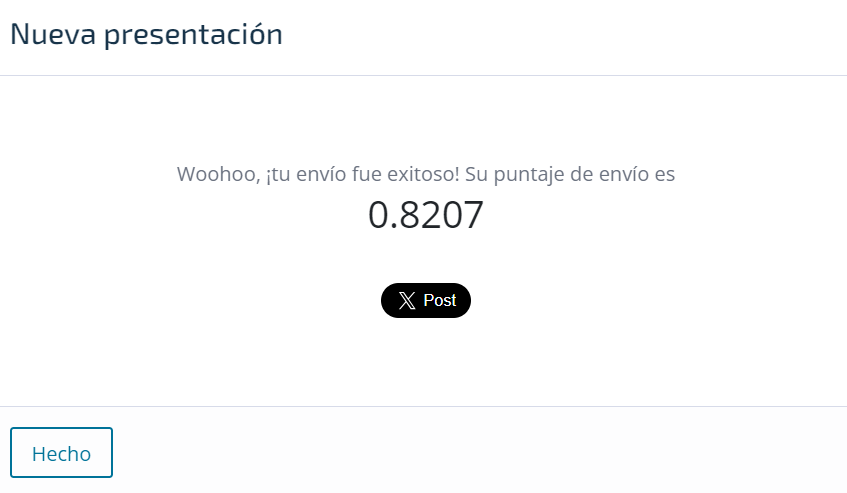

In [391]:
vc2.fit(data_itImp.drop(columns='status_group'), data_itImp['status_group'])
y_pred = vc2.predict(test_itImp)

quinta_pred = pd.DataFrame(data= zip(indices_test, y_pred), columns=['id', 'status_group'])

reverse_map = {v: k for k, v in encoding_map.items()}
quinta_pred.status_group = quinta_pred.status_group.map(reverse_map)

quinta_pred.to_csv('quinto_intento.csv', index=False)

#### PuntuaciónDrivenData:

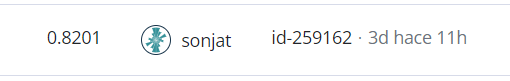